In [ ]:
!pip install opencv-python

In [ ]:
!pip install pyTelegramBotAPI
!pip install pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.9/242.9 kB 5.0 MB/s eta 0:00:00


In [ ]:
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import os
import telebot
import imageio
import cv2

In [ ]:
from torch import nn, optim
from tqdm import tqdm
from PIL import Image, ImageEnhance
from torchsummary import summary
from torchvision.utils import make_grid
from shutil import rmtree

In [ ]:
class SkipEncoderDecoder(nn.Module):
    def __init__(self, input_depth, num_channels_down = [128] * 5, num_channels_up = [128] * 5, num_channels_skip = [128] * 5):
        super(SkipEncoderDecoder, self).__init__()

        self.model = nn.Sequential()
        model_tmp = self.model

        for i in range(len(num_channels_down)):

            deeper = nn.Sequential()
            skip = nn.Sequential()

            if num_channels_skip[i] != 0:
                model_tmp.add_module(str(len(model_tmp) + 1), Concat(1, skip, deeper))
            else:
                model_tmp.add_module(str(len(model_tmp) + 1), deeper)

            model_tmp.add_module(str(len(model_tmp) + 1), nn.BatchNorm2d(num_channels_skip[i] + (num_channels_up[i + 1] if i < (len(num_channels_down) - 1) else num_channels_down[i])))

            if num_channels_skip[i] != 0:
                skip.add_module(str(len(skip) + 1), Conv2dBlock(input_depth, num_channels_skip[i], 1, bias = False))

            deeper.add_module(str(len(deeper) + 1), Conv2dBlock(input_depth, num_channels_down[i], 3, 2, bias = False))
            deeper.add_module(str(len(deeper) + 1), Conv2dBlock(num_channels_down[i], num_channels_down[i], 3, bias = False))

            deeper_main = nn.Sequential()

            if i == len(num_channels_down) - 1:
                k = num_channels_down[i]
            else:
                deeper.add_module(str(len(deeper) + 1), deeper_main)
                k = num_channels_up[i + 1]

            deeper.add_module(str(len(deeper) + 1), nn.Upsample(scale_factor = 2, mode = 'nearest'))

            model_tmp.add_module(str(len(model_tmp) + 1), Conv2dBlock(num_channels_skip[i] + k, num_channels_up[i], 3, 1, bias = False))
            model_tmp.add_module(str(len(model_tmp) + 1), Conv2dBlock(num_channels_up[i], num_channels_up[i], 1, bias = False))

            input_depth = num_channels_down[i]
            model_tmp = deeper_main

        self.model.add_module(str(len(self.model) + 1), nn.Conv2d(num_channels_up[0], 3, 1, bias = True))
        self.model.add_module(str(len(self.model) + 1), nn.Sigmoid())

    def forward(self, x):
        return self.model(x)


def input_noise(INPUT_DEPTH, spatial_size, scale = 1./10):
    shape = [1, INPUT_DEPTH, spatial_size[0], spatial_size[1]]
    return torch.rand(*shape) * scale


In [ ]:
class DepthwiseSeperableConv2d(nn.Module):
    def __init__(self, input_channels, output_channels, **kwargs):
        super(DepthwiseSeperableConv2d, self).__init__()

        self.depthwise = nn.Conv2d(input_channels, input_channels, groups = input_channels, **kwargs)
        self.pointwise = nn.Conv2d(input_channels, output_channels, kernel_size = 1)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)

        return x

class Conv2dBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride = 1, bias = False):
        super(Conv2dBlock, self).__init__()

        self.model = nn.Sequential(
            nn.ReflectionPad2d(int((kernel_size - 1) / 2)),
            DepthwiseSeperableConv2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = 0, bias = bias),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.model(x)

class Concat(nn.Module):
    def __init__(self, dim, *args):
        super(Concat, self).__init__()
        self.dim = dim

        for idx, module in enumerate(args):
            self.add_module(str(idx), module)

    def forward(self, input):
        inputs = []
        for module in self._modules.values():
            inputs.append(module(input))

        inputs_shapes2 = [x.shape[2] for x in inputs]
        inputs_shapes3 = [x.shape[3] for x in inputs]

        if np.all(np.array(inputs_shapes2) == min(inputs_shapes2)) and np.all(np.array(inputs_shapes3) == min(inputs_shapes3)):
            inputs_ = inputs
        else:
            target_shape2 = min(inputs_shapes2)
            target_shape3 = min(inputs_shapes3)

            inputs_ = []
            for inp in inputs:
                diff2 = (inp.size(2) - target_shape2) // 2
                diff3 = (inp.size(3) - target_shape3) // 2
                inputs_.append(inp[:, :, diff2: diff2 + target_shape2, diff3:diff3 + target_shape3])

        return torch.cat(inputs_, dim=self.dim)

    def __len__(self):
        return len(self._modules)

In [ ]:
def pil_to_np_array(pil_image):
    ar = np.array(pil_image)
    if len(ar.shape) == 3:
        ar = ar.transpose(2,0,1)
    else:
        ar = ar[None, ...]
    return ar.astype(np.float32) / 255.

def np_to_torch_array(np_array):
    return torch.from_numpy(np_array)[None, :]

def torch_to_np_array(torch_array):
    return torch_array.detach().cpu().numpy()[0]

def read_image(path, image_size = -1):
    pil_image = Image.open(path)
    return pil_image

def save_image(np_array, step):
    pil_image = Image.fromarray((np_array * 255.0).transpose(1, 2, 0).astype('uint8'), 'RGB')
    pil_image.save(f'progress/{str(step).zfill(len(str(TRAINING_STEPS)))}.png')

def crop_image(image, crop_factor = 64):
    shape = (image.size[0] - image.size[0] % crop_factor, image.size[1] - image.size[1] % crop_factor)
    bbox = [int((image.shape[0] - shape[0])/2), int((image.shape[1] - shape[1])/2), int((image.shape[0] + shape[0])/2), int((image.shape[1] + shape[1])/2)]
    return image.crop(bbox)

def get_image_grid(images, nrow = 3):
    torch_images = [torch.from_numpy(x) for x in images]
    grid = make_grid(torch_images, nrow)
    return grid.numpy()

def visualize_sample(*images_np, nrow = 3, size_factor = 10):
    c = max(x.shape[0] for x in images_np)
    images_np = [x if (x.shape[0] == c) else np.concatenate([x, x, x], axis = 0) for x in images_np]
    grid = get_image_grid(images_np, nrow)
    plt.figure(figsize = (len(images_np) + size_factor, 12 + size_factor))
    plt.axis('off')
    plt.imshow(grid.transpose(1, 2, 0))
    plt.show()

def max_dimension_resize(image_pil, mask_pil, max_dim):
    w, h = image_pil.size
    aspect_ratio = w / h
    if w > max_dim:
        h = int((h / w) * max_dim)
        w = max_dim
    elif h > max_dim:
        w = int((w / h) * max_dim)
        h = max_dim
    return image_pil.resize((w, h)), mask_pil.resize((w, h))

def preprocess_images(image_path, mask_path, max_dim):
    image_pil = read_image(image_path).convert('RGB')
    mask_pil = read_image(mask_path).convert('RGB')

    image_pil, mask_pil = max_dimension_resize(image_pil, mask_pil, max_dim)

    image_np = pil_to_np_array(image_pil)
    mask_np = pil_to_np_array(mask_pil)

    print('Visualizing mask overlap...')

    visualize_sample(image_np, mask_np, image_np * mask_np, nrow = 3, size_factor = 10)

    return image_np, mask_np

In [ ]:
def remove_watermark(image_path, mask_path, max_dim, reg_noise, input_depth, lr, show_step, training_steps, tqdm_length=100):
    DTYPE = torch.FloatTensor
    has_set_device = False
    if torch.cuda.is_available():
        device = 'cuda'
        has_set_device = True
        print("Установка устройства на CUDA...")
    try:
        if torch.backends.mps.is_available():
            device = 'mps'
            has_set_device = True
            print("Установка устройства на MPS...")
    except Exception as e:
        print(f"Ваша версия PyTorch может быть слишком старой и не поддерживать MPS. Ошибка: \n{e}")
        pass
    if not has_set_device:
        device = 'cpu'
        print('\nУстановка устройства на "cpu", так как PyTorch не собран с поддержкой "cuda" или "mps"...')
        print('Рекомендуется использовать GPU, если это возможно...')

    image_np, mask_np = preprocess_images(image_path, mask_path, max_dim)

    print('Построение модели...')
    generator = SkipEncoderDecoder(
        input_depth,
        num_channels_down = [128] * 5,
        num_channels_up = [128] * 5,
        num_channels_skip = [128] * 5
    ).type(DTYPE).to(device)

    objective = torch.nn.MSELoss().type(DTYPE).to(device)
    optimizer = optim.Adam(generator.parameters(), lr)

    image_var = np_to_torch_array(image_np).type(DTYPE).to(device)
    mask_var = np_to_torch_array(mask_np).type(DTYPE).to(device)

    generator_input = input_noise(input_depth, image_np.shape[1:]).type(DTYPE).to(device)

    generator_input_saved = generator_input.detach().clone()
    noise = generator_input.detach().clone()

    print('\nНачало обучения...\n')

    progress_bar = tqdm(range(training_steps), desc='Завершено', ncols=tqdm_length)

    for step in progress_bar:
        optimizer.zero_grad()
        generator_input = generator_input_saved

        if reg_noise > 0:
            generator_input = generator_input_saved + (noise.normal_() * reg_noise)

        output = generator(generator_input)

        loss = objective(output * mask_var, image_var * mask_var)
        loss.backward()

        if step % show_step == 0:
            output_image = torch_to_np_array(output)
            visualize_sample(image_np, output_image, nrow = 2, size_factor = 10)

        progress_bar.set_postfix(Потеря = loss.item())

        optimizer.step()

    output_image = torch_to_np_array(output)
    visualize_sample(output_image, nrow = 1, size_factor = 10)

    pil_image = Image.fromarray((output_image.transpose(1, 2, 0) * 255.0).astype('uint8'))

    output_path = image_path.split('/')[-1].split('.')[-2] + '-output.jpg'
    print(f'\nСохранение окончательного выходного изображения в: "{output_path}"\n')

    pil_image.save(output_path)


In [ ]:
def differences_in_the_image(base_image_path, overlay_image_path):
    # Загружаем изображения
    img1 = cv2.imread(base_image_path)
    img2 = cv2.imread(overlay_image_path)

    # Проверяем, что изображения загружены корректно
    if img1 is None:
        raise FileNotFoundError(f"Не удалось загрузить изображение: {base_image_path}")
    if img2 is None:
        raise FileNotFoundError(f"Не удалось загрузить изображение: {overlay_image_path}")

    # Приводим изображения к одному размеру
    img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

    # Вычисляем разность между изображениями
    diff = cv2.absdiff(img1, img2)

    # Применяем медианный фильтр для уменьшения шума
    filtered_diff = cv2.medianBlur(diff, 5)

    # Преобразуем изображение в градации серого
    gray_diff = cv2.cvtColor(filtered_diff, cv2.COLOR_BGR2GRAY)

    # Применяем пороговую обработку для преобразования изображения в двоичное (черно-белое)
    _, binary_diff = cv2.threshold(gray_diff, 50, 255, cv2.THRESH_BINARY)

    # Инвертируем изображение
    inverted_img = cv2.bitwise_not(binary_diff)

    # Сохраняем двоичное изображение в файл overlay_image_path
    cv2.imwrite(overlay_image_path, inverted_img)

In [ ]:
def remove_watermark_path(base_image_path, overlay_image_path):
    original_image_path  = base_image_path
    watermark_path = overlay_image_path

    # Чтение и изменение размера оригинального изображения
    original_image_pil = read_image(original_image_path)
    original_image_pil = original_image_pil.convert('RGB')
    original_image_pil.thumbnail((256, 256), Image.ANTIALIAS)

    w, h = original_image_pil.size
    aspect_ratio = w / h
    if w > MAX_DIM and w > h:
        h = int((h / w) * MAX_DIM)
        w = MAX_DIM
    elif h > MAX_DIM and h > w:
        w = int((w / h) * MAX_DIM)
        h = MAX_DIM

    original_image_pil = original_image_pil.resize((w, h))

    watermark_pil = read_image(watermark_path)
    watermark_pil = watermark_pil.convert('RGB')
    watermark_pil = watermark_pil.resize((original_image_pil.size[0], original_image_pil.size[1]))

    original_image_np = pil_to_np_array(original_image_pil)
    watermark_np = pil_to_np_array(watermark_pil)
    # watermark_np[watermark_np == 0.0] = 1.0

    watermarked_np = original_image_np * watermark_np
    image_mask_var = np_to_torch_array(watermark_np).type(DTYPE)

    visualize_sample(original_image_np, watermark_np, watermarked_np, nrow = 3, size_factor = 10)

    generator = SkipEncoderDecoder(
    INPUT_DEPTH,
    num_channels_down = [128] * 5,
    num_channels_up = [128] * 5,
    num_channels_skip = [128] * 5
    ).type(DTYPE)
    generator_input = input_noise(INPUT_DEPTH, watermarked_np.shape[1:]).type(DTYPE)
    summary(generator, generator_input.shape[1:])

    objective = torch.nn.MSELoss().type(DTYPE)
    optimizer = optim.Adam(generator.parameters(), LR)

    watermarked_var = np_to_torch_array(watermarked_np).type(DTYPE)
    watermark_var = np_to_torch_array(watermark_np).type(DTYPE)

    generator_input_saved = generator_input.detach().clone()
    noise = generator_input.detach().clone()

    file_path_at_TRAINING_STEPS = None

    if os.path.isdir('progress'):
        rmtree('progress')
    os.mkdir('progress')

    for step in range(TRAINING_STEPS):
        optimizer.zero_grad()
        generator_input = generator_input_saved

        if REG_NOISE > 0:
            generator_input = generator_input_saved + (noise.normal_() * REG_NOISE)

        output = generator(generator_input)

        loss = objective(output * watermark_var, watermarked_var)
        loss.backward()

        if step % SHOW_STEP == 0:
            output_image = torch_to_np_array(output)
            save_image(output_image, step)
            visualize_sample(output_image, nrow = 1, size_factor = 5)
            print(f'Step: {step} | Loss: {loss.item()}')
        optimizer.step()

    file_path_at_TRAINING_STEPS = f'/content/progress/{TRAINING_STEPS - SHOW_STEP}.png'

    return file_path_at_TRAINING_STEPS

In [ ]:
%cd content/sample_data

[Errno 2] No such file or directory: 'content/sample_data'
/content


In [ ]:
!mkdir -p data/photos
!mkdir -p progress

In [ ]:
DTYPE = torch.cuda.FloatTensor
INPUT_DEPTH = 64
LR = 0.01
TRAINING_STEPS = 2000
SHOW_STEP = 100
REG_NOISE = 0.03
MAX_DIM = 256

Бот активирован


<ipython-input-10-8f85bea0727f>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  original_image_pil.thumbnail((256, 256), Image.ANTIALIAS)


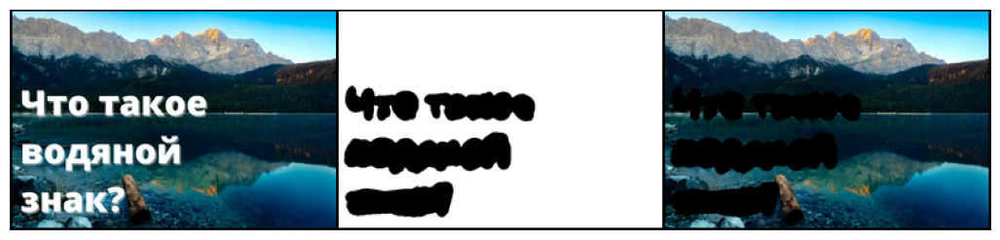

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1         [-1, 64, 171, 256]               0
            Conv2d-2         [-1, 64, 171, 256]              64
            Conv2d-3        [-1, 128, 171, 256]           8,320
DepthwiseSeperableConv2d-4        [-1, 128, 171, 256]               0
       BatchNorm2d-5        [-1, 128, 171, 256]             256
         LeakyReLU-6        [-1, 128, 171, 256]               0
       Conv2dBlock-7        [-1, 128, 171, 256]               0
   ReflectionPad2d-8         [-1, 64, 173, 258]               0
            Conv2d-9          [-1, 64, 86, 128]             576
           Conv2d-10         [-1, 128, 86, 128]           8,320
DepthwiseSeperableConv2d-11         [-1, 128, 86, 128]               0
      BatchNorm2d-12         [-1, 128, 86, 128]             256
        LeakyReLU-13         [-1, 128, 86, 128]               0
      Conv2dBlock-14      

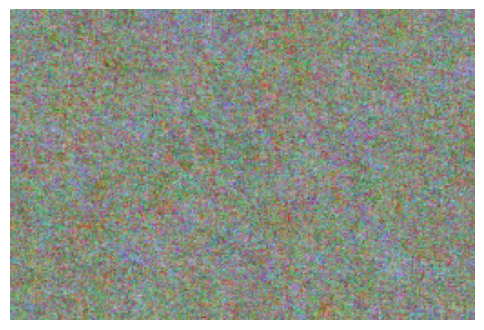

Step: 0 | Loss: 0.11181004345417023


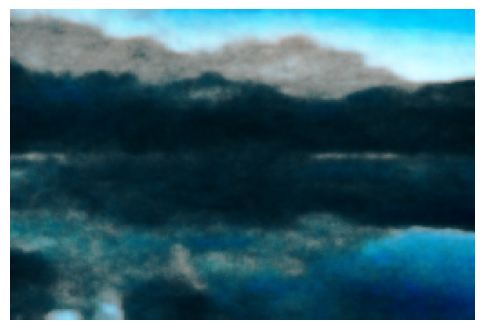

Step: 100 | Loss: 0.003157422412186861


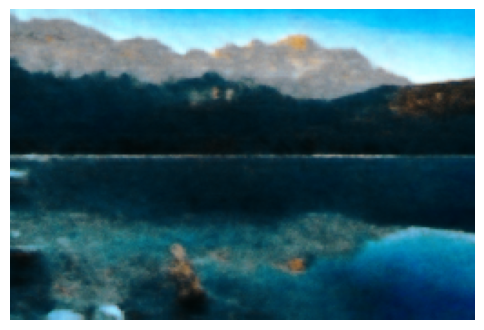

Step: 200 | Loss: 0.0015693942550569773


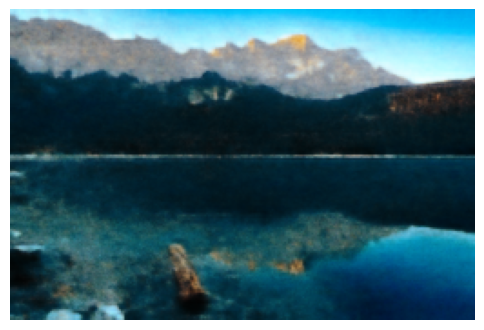

Step: 300 | Loss: 0.0011501461267471313


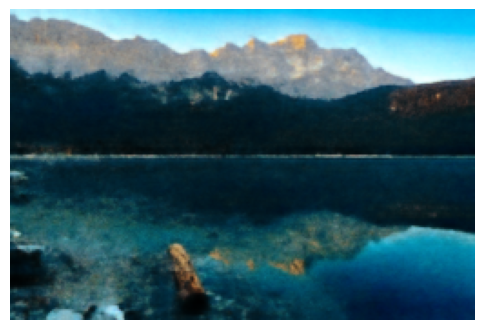

Step: 400 | Loss: 0.000908961403183639


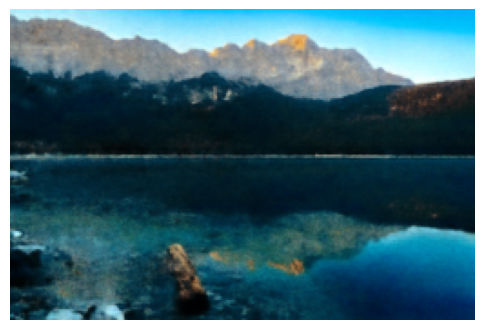

Step: 500 | Loss: 0.0007395543507300317


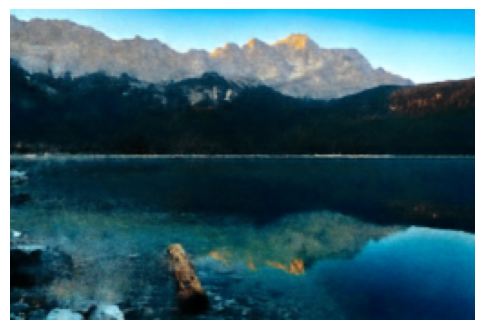

Step: 600 | Loss: 0.0006249949219636619


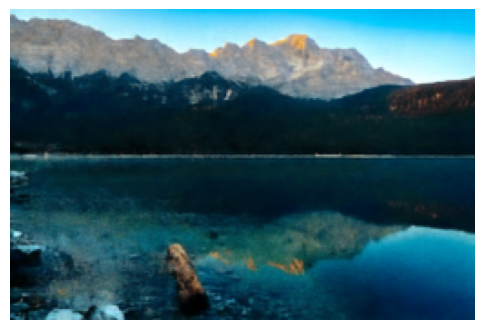

Step: 700 | Loss: 0.0004993620095774531


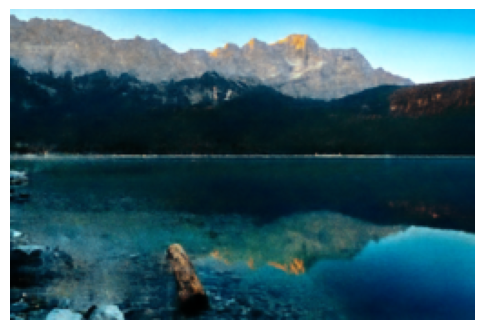

Step: 800 | Loss: 0.000450187741080299


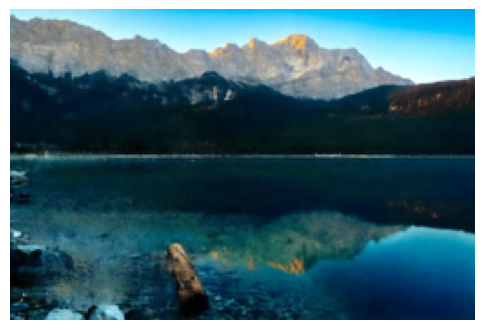

Step: 900 | Loss: 0.0003983817296102643


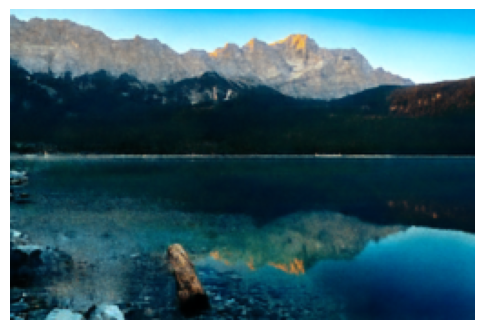

Step: 1000 | Loss: 0.0003480711893644184


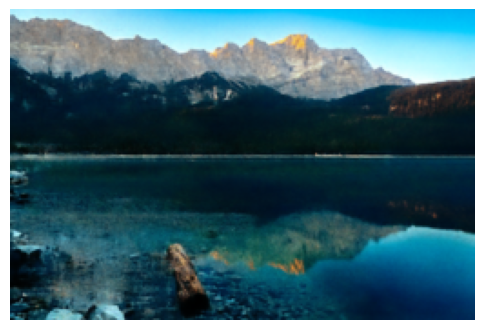

Step: 1100 | Loss: 0.00032400834606960416


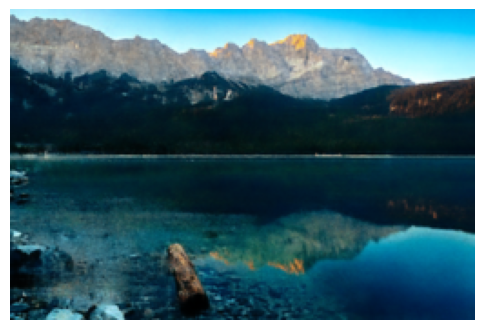

Step: 1200 | Loss: 0.00027240708004683256


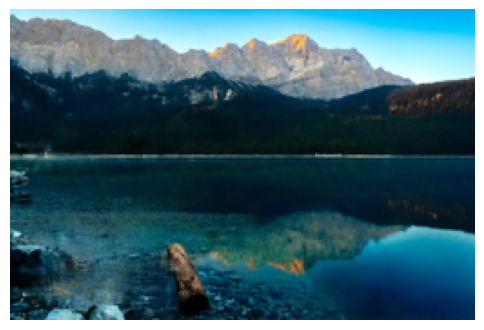

Step: 1300 | Loss: 0.00024173111887648702


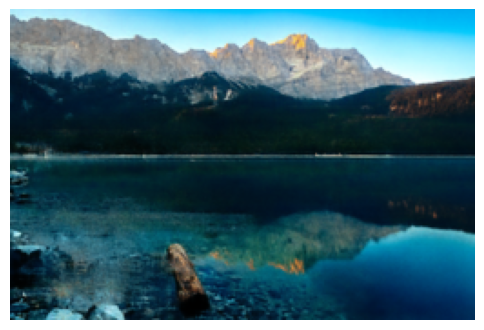

Step: 1400 | Loss: 0.00022780000290367752


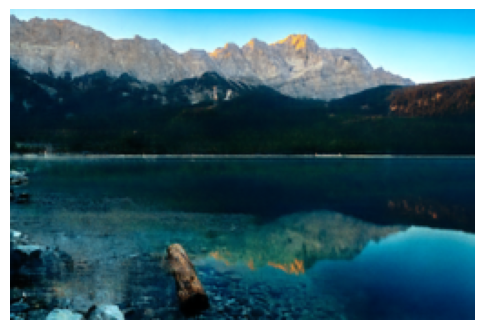

Step: 1500 | Loss: 0.00020862222299911082


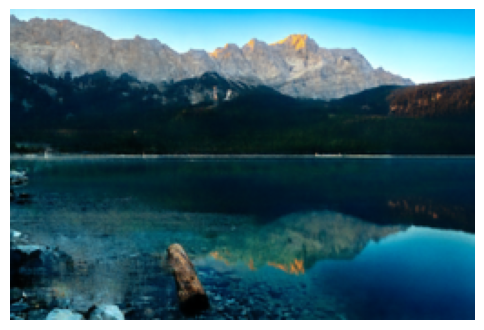

Step: 1600 | Loss: 0.00020327529637143016


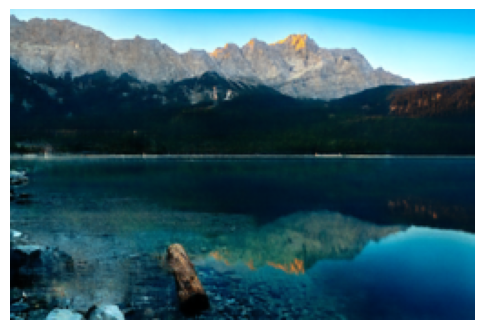

Step: 1700 | Loss: 0.00017048210429493338


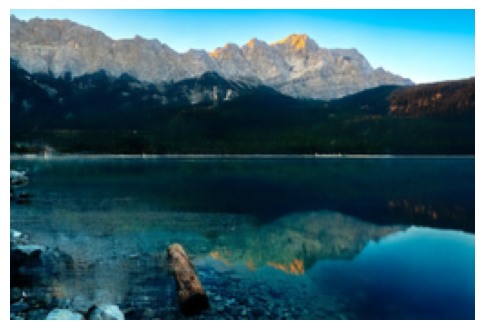

Step: 1800 | Loss: 0.00015514188271481544


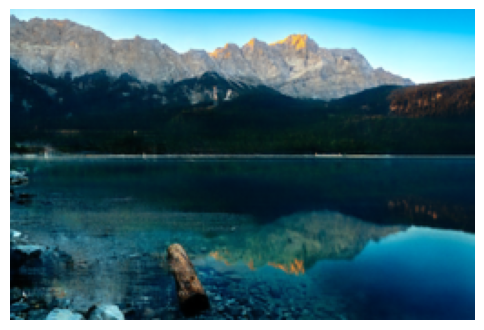

Step: 1900 | Loss: 0.00015885059838183224


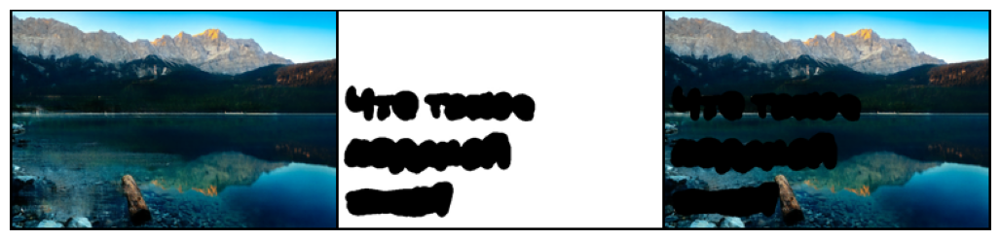

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1         [-1, 64, 171, 256]               0
            Conv2d-2         [-1, 64, 171, 256]              64
            Conv2d-3        [-1, 128, 171, 256]           8,320
DepthwiseSeperableConv2d-4        [-1, 128, 171, 256]               0
       BatchNorm2d-5        [-1, 128, 171, 256]             256
         LeakyReLU-6        [-1, 128, 171, 256]               0
       Conv2dBlock-7        [-1, 128, 171, 256]               0
   ReflectionPad2d-8         [-1, 64, 173, 258]               0
            Conv2d-9          [-1, 64, 86, 128]             576
           Conv2d-10         [-1, 128, 86, 128]           8,320
DepthwiseSeperableConv2d-11         [-1, 128, 86, 128]               0
      BatchNorm2d-12         [-1, 128, 86, 128]             256
        LeakyReLU-13         [-1, 128, 86, 128]               0
      Conv2dBlock-14      

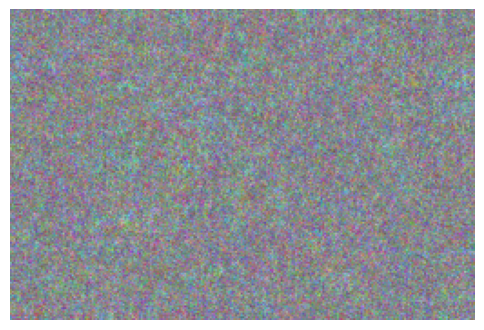

Step: 0 | Loss: 0.11508820950984955


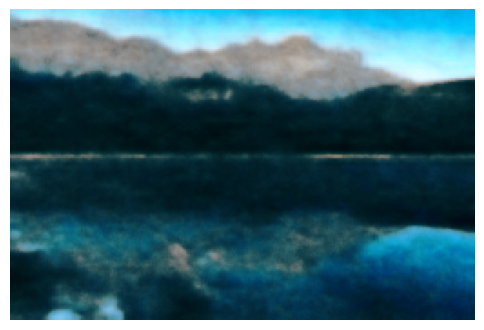

Step: 100 | Loss: 0.002365057822316885


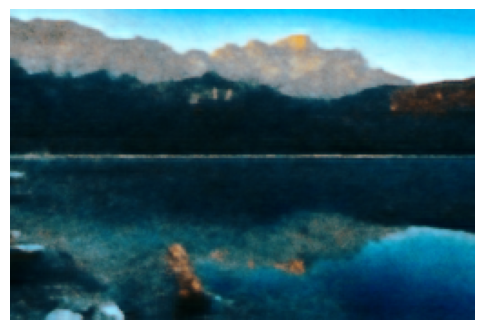

Step: 200 | Loss: 0.001194859272800386


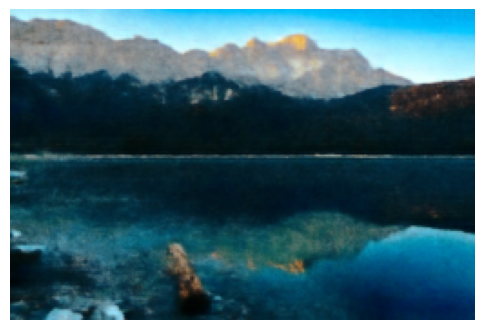

Step: 300 | Loss: 0.0008160255383700132


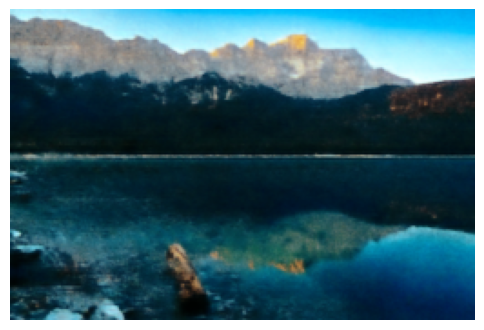

Step: 400 | Loss: 0.0005941277486272156


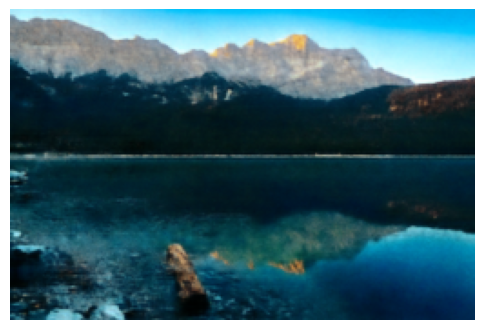

Step: 500 | Loss: 0.0004722157318610698


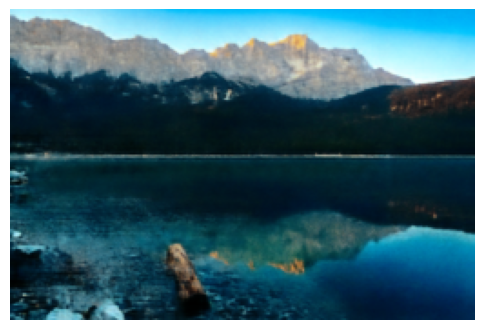

Step: 600 | Loss: 0.0003748975577764213


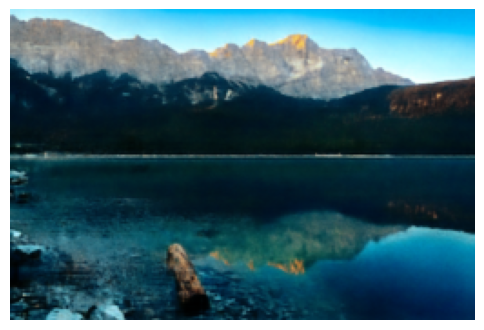

Step: 700 | Loss: 0.00029400779749266803


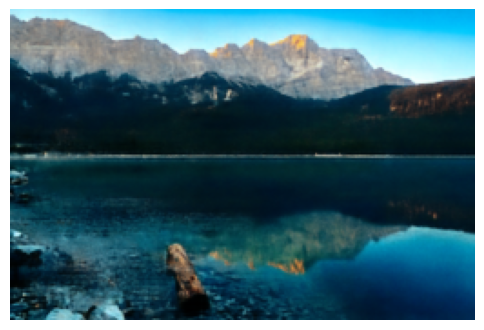

Step: 800 | Loss: 0.00023399549536406994


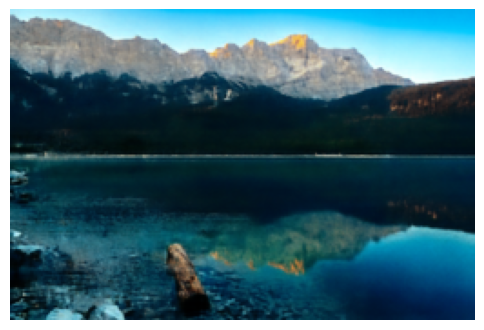

Step: 900 | Loss: 0.00018443366570863873


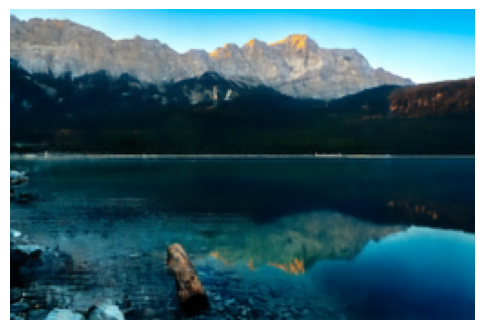

Step: 1000 | Loss: 0.00016562557721044868


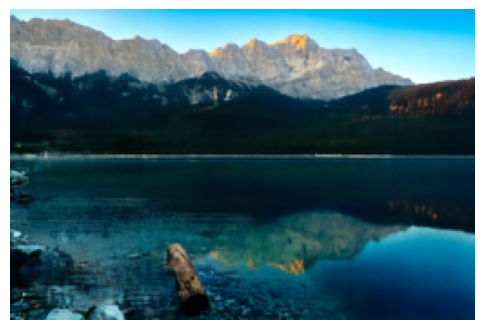

Step: 1100 | Loss: 0.00013886467786505818


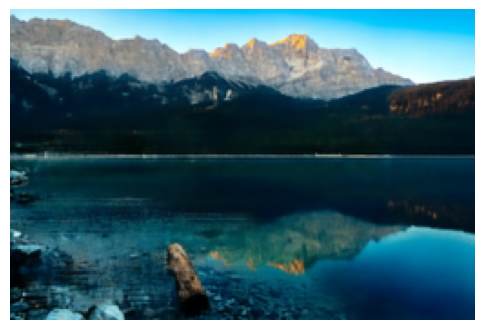

Step: 1200 | Loss: 0.0001290275831706822


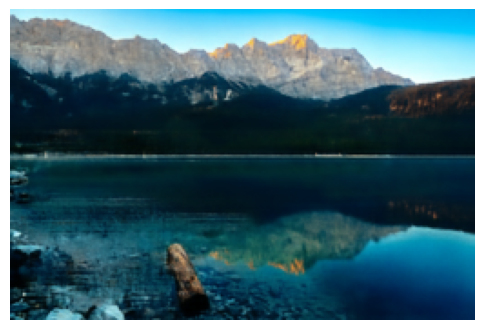

Step: 1300 | Loss: 0.00010525579273235053


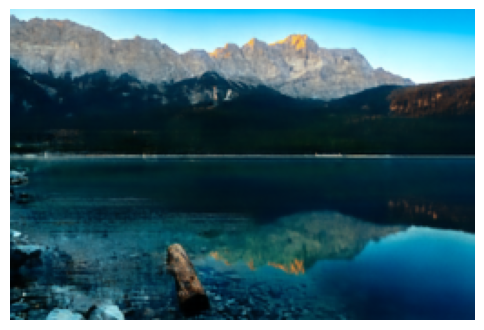

Step: 1400 | Loss: 0.00010771557572297752


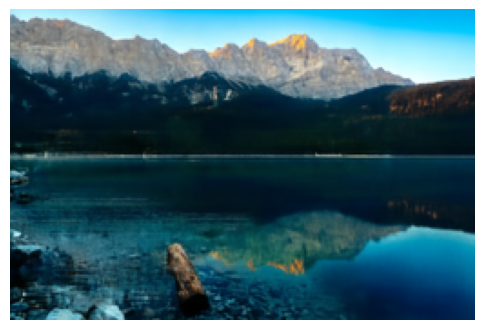

Step: 1500 | Loss: 9.072382090380415e-05


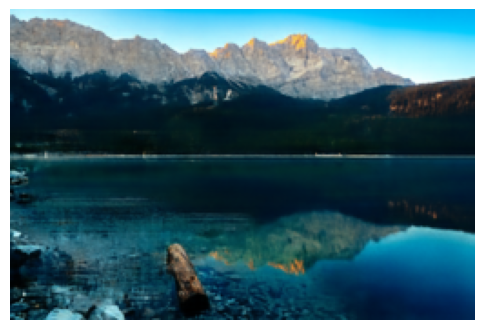

Step: 1600 | Loss: 7.430565165122971e-05


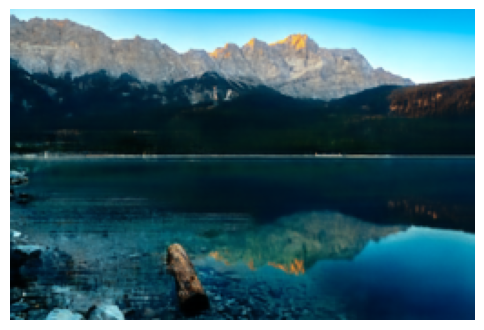

Step: 1700 | Loss: 6.700392987113446e-05


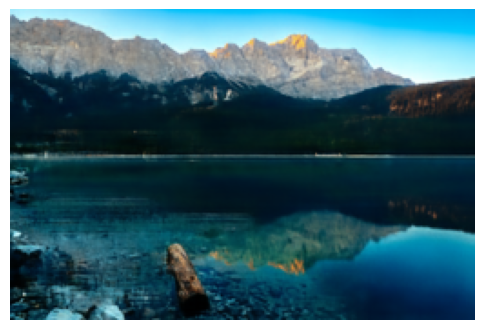

Step: 1800 | Loss: 6.47467968519777e-05


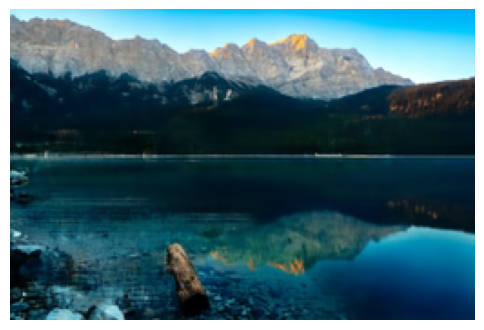

Step: 1900 | Loss: 5.819576108478941e-05
{}


In [ ]:
print('Бот активирован')

bot = telebot.TeleBot('6747316048:AAGPJEGBqttVUoEtasHvyqsfneW80BrBUNY')

# Словарь для хранения состояния чата и изображений, связанных с каждым чатом.
chat_states = {}
images = {}

# Функция для очистки содержимого (изображений) для заданного чата.
def clear_content(chat_id):
    try:
        # Пытаемся удалить все изображения, связанные с данным чатом.
        for img in images[chat_id]:
            os.remove(img)
    except Exception as e:
        print(f"Ошибка при очистке содержимого: {e}")
    images[chat_id] = []

# Обработчик команды /start, который приветствует пользователя и просит прислать первое фото.
@bot.message_handler(commands=['start'])
def start_message(message):
    chatId = message.chat.id
    chat_states[chatId] = 'awaiting_first_photo'
    images[chatId] = []
    bot.send_message(chatId, 'Привет! Пожалуйста, загрузите фотографию с водяным знаком.')

# Обработчик получения фотографий от пользователя.
@bot.message_handler(content_types=['photo'])
def handle_docs_photo(message):
    chatId = message.chat.id

    if chat_states.get(chatId) == 'awaiting_first_photo':
        try:
            # Получаем информацию о последнем фото в сообщении.
            file_info = bot.get_file(message.photo[-1].file_id)

            # Скачиваем файл.
            downloaded_file = bot.download_file(file_info.file_path)

            # Определяем путь для сохранения скачанного файла.
            src = os.path.join('data/photos', file_info.file_path.split('/')[-1])

            # Сохраняем скачанный файл.
            with open(src, 'wb') as new_file:
                new_file.write(downloaded_file)

            # Добавляем путь к скачанному файлу в список изображений.
            images[chatId].append(src)

            # Обновляем состояние чата и просим загрузить второе фото.
            chat_states[chatId] = 'awaiting_second_photo'
            bot.send_message(chatId, 'Теперь загрузите фото с обведенным водяным знаком.')

        except Exception as e:
            # В случае ошибки отправляем сообщение с текстом ошибки.
            bot.reply_to(message, str(e))

    elif chat_states.get(chatId) == 'awaiting_second_photo':
        try:
            # Получаем информацию о последнем фото в сообщении.
            file_info = bot.get_file(message.photo[-1].file_id)

            # Скачиваем файл.
            downloaded_file = bot.download_file(file_info.file_path)

            # Определяем путь для сохранения скачанного файла.
            src = os.path.join('data/photos', file_info.file_path.split('/')[-1])

            # Сохраняем скачанный файл.
            with open(src, 'wb') as new_file:
                new_file.write(downloaded_file)

            # Добавляем путь к скачанному файлу в список изображений.
            images[chatId].append(src)

            # Обрабатываем второе изображение
            differences_in_the_image(images[chatId][0], images[chatId][1])

            # Обрабатываем изображения (наложение второго изображения на первое).
            second_process_img = remove_watermark_path(images[chatId][0], images[chatId][1])
            reply_img = remove_watermark_path(second_process_img, images[chatId][1])
            print({})

            # Проверяем существование файла перед отправкой.
            if os.path.exists(reply_img):
                # Отправляем обработанное изображение пользователю.
                bot.send_photo(chatId, open(reply_img, 'rb'))
            else:
                bot.reply_to(message, 'Ошибка: обработанное изображение не найдено.')

            # Очищаем состояния и изображения для данного чата.
            clear_content(chatId)
            chat_states[chatId] = None

        except Exception as e:
            # В случае ошибки отправляем сообщение с текстом ошибки.
            bot.reply_to(message, str(e))
# Запуск долгосрочного опроса для обработки сообщений.
bot.polling()
